In [1]:
import torchvision

In [2]:
# Khoa_LHR_image.zip
!gdown --id 1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3

/media/tan/F/AIO2024_hw/env/lib/python3.10/site-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3
From (redirected): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3&confirm=t&uuid=22ae84cc-3a03-4fe9-840e-14e1279fc1d1
To: /media/tan/F/AIO2024_hw/AIO2024_hw/Module7/week1/Khoa_LHR_image.zip
100%|██████████████████████████████████████| 89.0M/89.0M [00:03<00:00, 28.9MB/s]


In [2]:
import torch


In [3]:
train_data_path =  "Resized_folder/train"
val_data_path = "Resized_folder/val"

batch_size = 16

In [4]:
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms 
from PIL import Image
import os

class MyDataset(Dataset):
    def __init__(self, lr_dir, hr_dir, lr_transforms = None, hr_transforms = None):
        self.lr_dir = lr_dir
        self.hr_dir = hr_dir

        self.lr_transforms = lr_transforms
        self.hr_transforms = hr_transforms

        self.lr_filenames = sorted(os.listdir(lr_dir))
        self.hr_filenames = sorted(os.listdir(hr_dir))

        assert len(self.lr_filenames) == len(self.hr_filenames), \
        "Số lượng ảnh LR và HR không khớp!"

    def __len__(self):
        return len(self.lr_filenames)
    
    def __getitem__(self, idx):
        lr_name = self.lr_filenames[idx]
        hr_name = self.hr_filenames[idx]

        lr_path = os.path.join(self.lr_dir, lr_name)
        hr_path = os.path.join(self.hr_dir, hr_name)

        lr_image = Image.open(lr_path).convert("RGB")
        hr_image = Image.open(hr_path).convert("RGB")

        # Áp dụng transforms 
        if self.lr_transforms:
            lr_image = self.lr_transforms(lr_image)
        if self.hr_transforms:
            hr_image = self.hr_transforms(hr_image)

        return lr_image, hr_image



In [5]:
lr_transforms = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize(mean = [0.5,0.5,0.5],
                             std = [0.5,0.5,0.5])
    ]
)

hr_transforms = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize(mean = [0.5,0.5,0.5],
                             std = [0.5,0.5,0.5])
    ]
)

In [7]:
train_dataset = MyDataset(lr_dir="Resized_folder/train", hr_dir="Khoa_LHR_image/train", lr_transforms = lr_transforms, hr_transforms = hr_transforms)
val_dataset = MyDataset(lr_dir="Resized_folder/val", hr_dir="Khoa_LHR_image/val", lr_transforms = lr_transforms, hr_transforms = hr_transforms)

train_dataloader = DataLoader(dataset=train_dataset,
                              batch_size=8,
                              shuffle=True,
                              num_workers=2)

val_dataloader = DataLoader(dataset=val_dataset,
                              batch_size=8,
                              shuffle=True,
                              num_workers=2)

In [10]:
for images, labels in train_dataloader:
    print(images.shape)  # (batch_size, channels, height, width)
    print(labels.shape)  # tuỳ vào bài toán
    break

torch.Size([8, 3, 64, 64])
torch.Size([8, 3, 256, 256])


### Xây dựng model

In [17]:
import torch.nn as nn

class FirstFeature(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeature, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlock(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Decoder, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x, skip):
        x = self.conv(x)
        x = torch.concat([x, skip], dim=1)
        x = self.conv_block(x)
        return x


class FinalOutput(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutput, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class SR_Unet(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3
    ):
        super(SR_Unet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.resize_fnc = transforms.Resize((64*4, 64*4),
                                             antialias=True)
        self.in_conv1 = FirstFeature(n_channels, 64)
        self.in_conv2 = ConvBlock(64, 64)

        self.enc_1 = Encoder(64, 128)
        self.enc_2 = Encoder(128, 256)
        self.enc_3 = Encoder(256, 512)
        self.enc_4 = Encoder(512, 1024)

        self.dec_1 = Decoder(1024, 512)
        self.dec_2 = Decoder(512, 256)
        self.dec_3 = Decoder(256, 128)
        self.dec_4 = Decoder(128, 64)

        self.out_conv = FinalOutput(64, n_classes)


    def forward(self, x):
        x = self.resize_fnc(x)
        x = self.in_conv1(x)
        x1 = self.in_conv2(x)

        x2 = self.enc_1(x1)
        x3 = self.enc_2(x2)
        x4 = self.enc_3(x3)
        x5 = self.enc_4(x4)

        x = self.dec_1(x5, x4)
        x = self.dec_2(x, x3)
        x = self.dec_3(x, x2)
        x = self.dec_4(x, x1)

        x = self.out_conv(x)
        return x

In [18]:
from torchsummary import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SR_Unet().to(device)

In [21]:
summary(model, (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Resize-1          [-1, 3, 256, 256]               0
            Conv2d-2         [-1, 64, 256, 256]             192
         LeakyReLU-3         [-1, 64, 256, 256]               0
      FirstFeature-4         [-1, 64, 256, 256]               0
            Conv2d-5         [-1, 64, 256, 256]          36,864
       BatchNorm2d-6         [-1, 64, 256, 256]             128
         LeakyReLU-7         [-1, 64, 256, 256]               0
            Conv2d-8         [-1, 64, 256, 256]          36,864
       BatchNorm2d-9         [-1, 64, 256, 256]             128
        LeakyReLU-10         [-1, 64, 256, 256]               0
        ConvBlock-11         [-1, 64, 256, 256]               0
        MaxPool2d-12         [-1, 64, 128, 128]               0
           Conv2d-13        [-1, 128, 128, 128]          73,728
      BatchNorm2d-14        [-1, 128, 1

In [22]:
import matplotlib.pyplot as plt

def generate_images(model, inputs, labels):
    model.eval()
    with torch.no_grad():
        inputs, labels = inputs.to(device), labels.to(device)
        predictions = model(inputs)
    inputs, labels, predictions = inputs.cpu().numpy(), labels.cpu().numpy(), predictions.cpu().numpy()
    plt.figure(figsize=(15,20))

    display_list = [inputs[-1].transpose((1, 2, 0)), labels[-1].transpose((1, 2, 0)), predictions[-1].transpose((1, 2, 0))]
    title = ['Input', 'Real', 'Predicted']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow((display_list[i] + 1) / 2)
        plt.axis('off')
    plt.show()

In [30]:
import time
from skimage.metrics import peak_signal_noise_ratio

def train_epoch(model, optimizer, criterion, train_dataloader, device, epoch=0,
                log_interval=50):
    model.train()
    total_psnr, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()
        prediction = predictions.detach().cpu().numpy()  # Chuyển tensor về NumPy
        label = labels.detach().cpu().numpy()

        total_psnr += peak_signal_noise_ratio(prediction, label, data_range=1.0)
        total_count += 1
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| psnr {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_psnr / total_count
                )
            )
            total_psnr, total_count = 0, 0
            start_time = time.time()

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [40]:
def evaluate_epoch(model, criterion, valid_dataloader, device):
    model.eval()
    total_psnr, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            predictions = model(inputs)

            loss = criterion(predictions, labels)
            losses.append(loss.item())

            prediction = predictions.detach().cpu().numpy()  # Chuyển tensor về NumPy
            label = labels.detach().cpu().numpy()

            total_psnr +=  peak_signal_noise_ratio(prediction, label)
            total_count += 1

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [45]:
def train(model, model_name, save_model, optimizer, criterion, train_dataloader, valid_dataloader, num_epochs, device):
    train_psnrs, train_losses = [], []
    eval_psnrs, eval_losses = [], []
    best_psnr_eval = -1000
    times = []
    for epoch in range(1, num_epochs+1):
        epoch_start_time = time.time()
        # Training
        train_psnr, train_loss = train_epoch(model, optimizer, criterion, train_dataloader, device, epoch)
        train_psnrs.append(train_psnr)
        train_losses.append(train_loss)

        # Evaluation
        eval_psnr, eval_loss = evaluate_epoch(model, criterion, valid_dataloader, device)
        eval_psnrs.append(eval_psnr)
        eval_losses.append(eval_loss)

        # Save best model
        if best_psnr_eval < eval_psnr :
            torch.save(model.state_dict(), save_model + f'/{model_name}.pt')
            inputs_t, targets_t = next(iter(valid_dataloader))
            generate_images(model, inputs_t, targets_t)
            best_psnr_eval = eval_psnr
        times.append(time.time() - epoch_start_time)
        # Print loss, psnr end epoch
        print("-" * 59)
        print(
            "| End of epoch {:3d} | Time: {:5.2f}s | Train psnr {:8.3f} | Train Loss {:8.3f} "
            "| Valid psnr {:8.3f} | Valid Loss {:8.3f} ".format(
                epoch, time.time() - epoch_start_time, train_psnr, train_loss, eval_psnr, eval_loss
            )
        )
        print("-" * 59)

    # Load best model
    model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))
    model.eval()
    metrics = {
        'train_psnr': train_psnrs,
        'train_loss': train_losses,
        'valid_psnr': eval_psnrs,
        'valid_loss': eval_losses,
        'time': times
    }
    return model, metrics

In [46]:
import matplotlib.pyplot as plt

def plot_result(num_epochs, train_psnrs, eval_psnrs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_psnrs, label = "Training")
    axs[0].plot(epochs, eval_psnrs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("PSNR")
    axs[1].set_ylabel("Loss")
    plt.legend()

In [47]:
import matplotlib.pyplot as plt

def predict_and_display(model, test_dataloader, device):
    model.eval()

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(test_dataloader):
            if idx >= 10:
                break
            inputs = inputs.to(device)
            predictions = model(inputs)
            generate_images(model, inputs, labels)
            plt.show()

| epoch   1 |    50/   86 batches | psnr   12.830


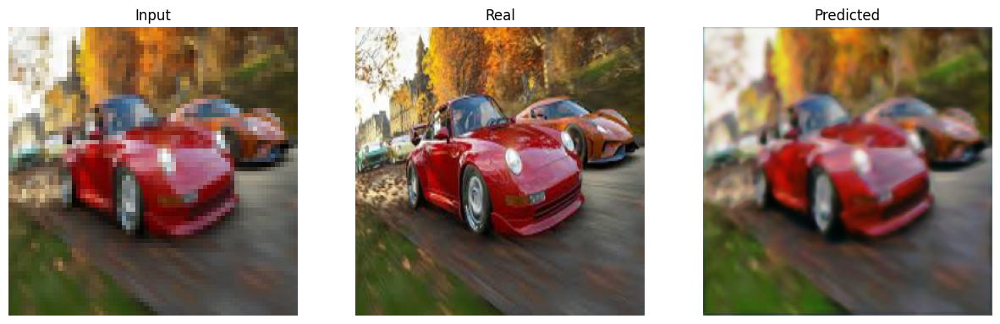

-----------------------------------------------------------
| End of epoch   1 | Time: 38.78s | Train psnr   14.808 | Train Loss    0.162 | Valid psnr   22.180 | Valid Loss    0.105 
-----------------------------------------------------------
| epoch   2 |    50/   86 batches | psnr   15.992


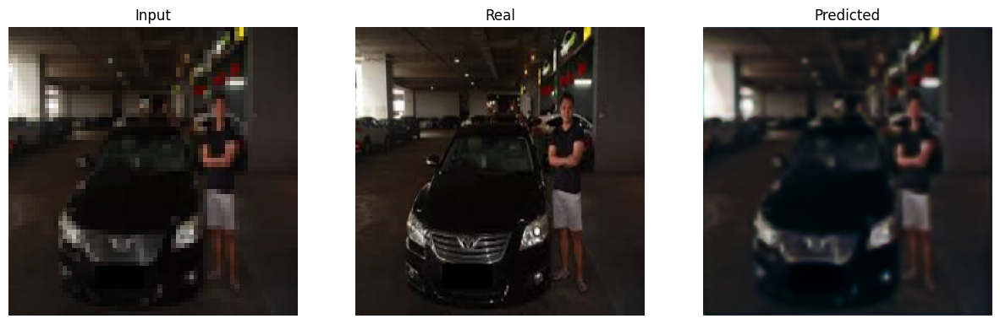

-----------------------------------------------------------
| End of epoch   2 | Time: 38.59s | Train psnr   15.973 | Train Loss    0.114 | Valid psnr   22.913 | Valid Loss    0.091 
-----------------------------------------------------------
| epoch   3 |    50/   86 batches | psnr   16.519


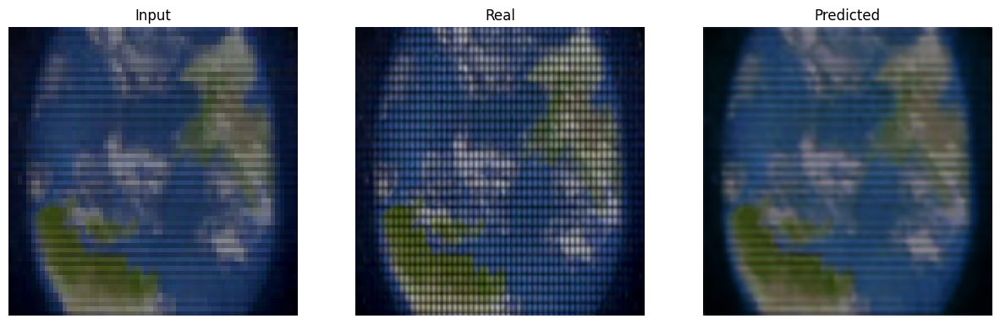

-----------------------------------------------------------
| End of epoch   3 | Time: 38.55s | Train psnr   16.728 | Train Loss    0.105 | Valid psnr   23.686 | Valid Loss    0.085 
-----------------------------------------------------------
| epoch   4 |    50/   86 batches | psnr   16.980


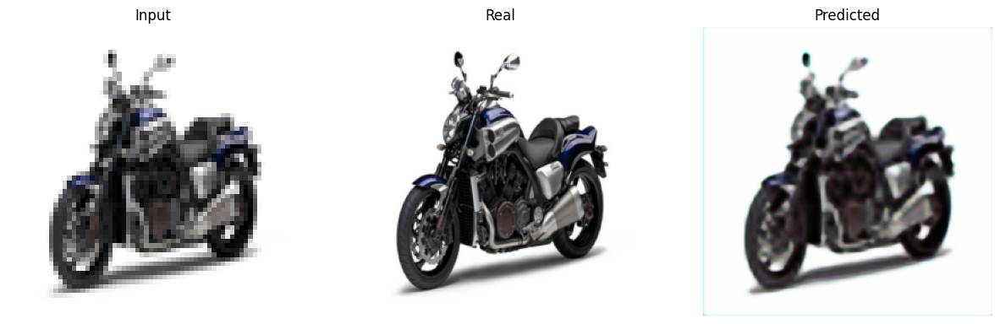

-----------------------------------------------------------
| End of epoch   4 | Time: 38.50s | Train psnr   17.142 | Train Loss    0.099 | Valid psnr   23.886 | Valid Loss    0.081 
-----------------------------------------------------------
| epoch   5 |    50/   86 batches | psnr   17.127


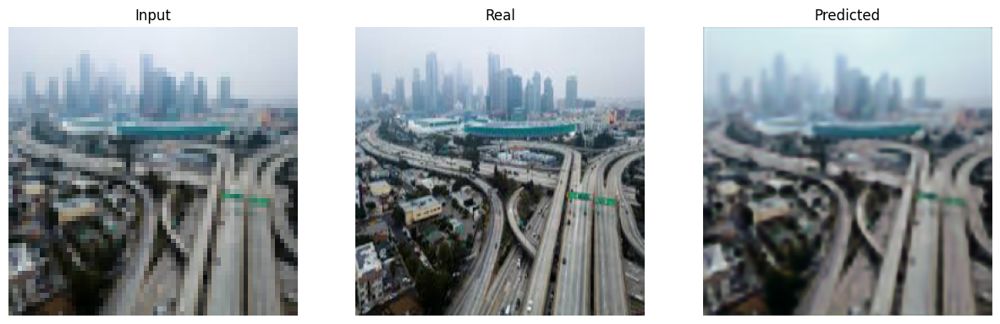

-----------------------------------------------------------
| End of epoch   5 | Time: 38.52s | Train psnr   17.188 | Train Loss    0.098 | Valid psnr   24.338 | Valid Loss    0.077 
-----------------------------------------------------------
| epoch   6 |    50/   86 batches | psnr   17.344
-----------------------------------------------------------
| End of epoch   6 | Time: 37.18s | Train psnr   17.260 | Train Loss    0.095 | Valid psnr   24.194 | Valid Loss    0.078 
-----------------------------------------------------------
| epoch   7 |    50/   86 batches | psnr   17.370
-----------------------------------------------------------
| End of epoch   7 | Time: 37.32s | Train psnr   17.602 | Train Loss    0.093 | Valid psnr   24.287 | Valid Loss    0.077 
-----------------------------------------------------------
| epoch   8 |    50/   86 batches | psnr   17.891


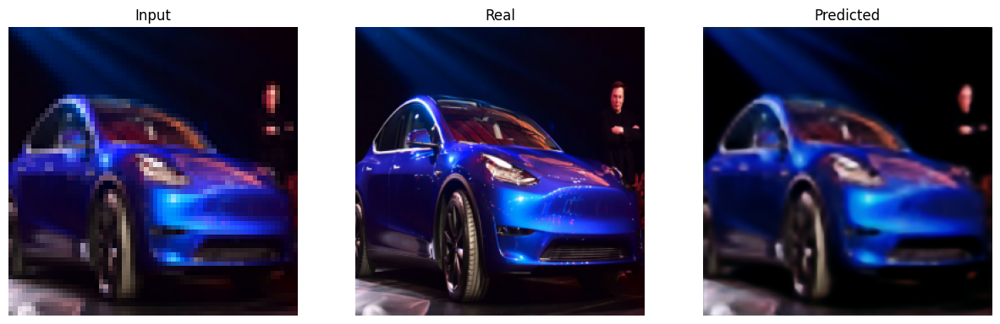

-----------------------------------------------------------
| End of epoch   8 | Time: 38.95s | Train psnr   17.362 | Train Loss    0.090 | Valid psnr   24.467 | Valid Loss    0.075 
-----------------------------------------------------------
| epoch   9 |    50/   86 batches | psnr   17.777


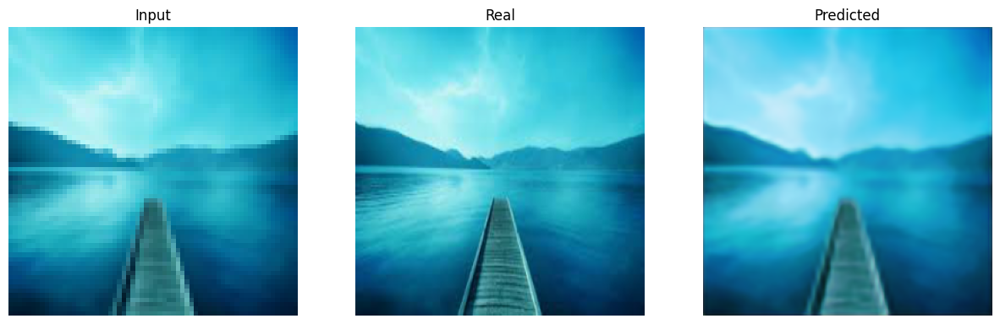

-----------------------------------------------------------
| End of epoch   9 | Time: 38.77s | Train psnr   17.811 | Train Loss    0.088 | Valid psnr   24.704 | Valid Loss    0.072 
-----------------------------------------------------------
| epoch  10 |    50/   86 batches | psnr   17.875
-----------------------------------------------------------
| End of epoch  10 | Time: 37.21s | Train psnr   17.869 | Train Loss    0.087 | Valid psnr   24.518 | Valid Loss    0.074 
-----------------------------------------------------------
| epoch  11 |    50/   86 batches | psnr   18.226
-----------------------------------------------------------
| End of epoch  11 | Time: 37.21s | Train psnr   18.054 | Train Loss    0.082 | Valid psnr   24.628 | Valid Loss    0.072 
-----------------------------------------------------------
| epoch  12 |    50/   86 batches | psnr   18.117
-----------------------------------------------------------
| End of epoch  12 | Time: 37.20s | Train psnr   18.030 | Tra

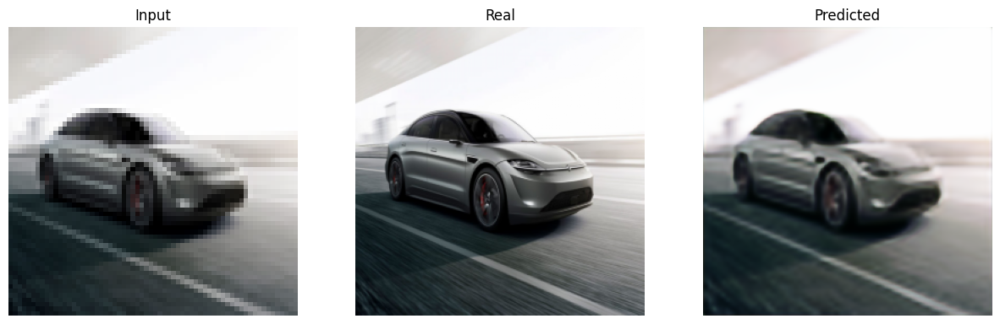

-----------------------------------------------------------
| End of epoch  14 | Time: 38.71s | Train psnr   18.240 | Train Loss    0.081 | Valid psnr   24.748 | Valid Loss    0.074 
-----------------------------------------------------------
| epoch  15 |    50/   86 batches | psnr   18.412
-----------------------------------------------------------
| End of epoch  15 | Time: 37.23s | Train psnr   18.147 | Train Loss    0.080 | Valid psnr   24.150 | Valid Loss    0.081 
-----------------------------------------------------------
| epoch  16 |    50/   86 batches | psnr   18.437


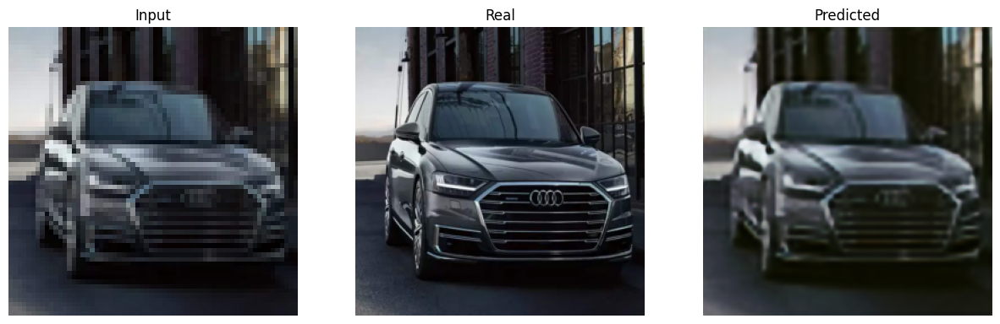

-----------------------------------------------------------
| End of epoch  16 | Time: 38.83s | Train psnr   18.054 | Train Loss    0.081 | Valid psnr   24.847 | Valid Loss    0.072 
-----------------------------------------------------------
| epoch  17 |    50/   86 batches | psnr   18.292
-----------------------------------------------------------
| End of epoch  17 | Time: 37.38s | Train psnr   18.405 | Train Loss    0.081 | Valid psnr   24.790 | Valid Loss    0.071 
-----------------------------------------------------------
| epoch  18 |    50/   86 batches | psnr   18.342
-----------------------------------------------------------
| End of epoch  18 | Time: 37.34s | Train psnr   18.088 | Train Loss    0.082 | Valid psnr   24.679 | Valid Loss    0.075 
-----------------------------------------------------------
| epoch  19 |    50/   86 batches | psnr   18.276
-----------------------------------------------------------
| End of epoch  19 | Time: 37.25s | Train psnr   18.624 | Tra

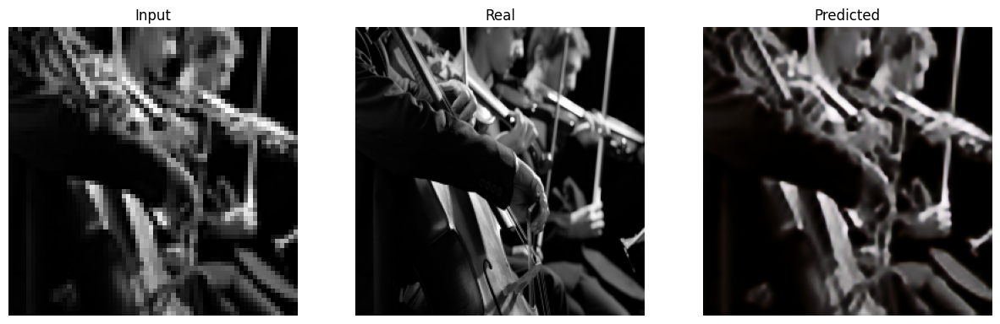

-----------------------------------------------------------
| End of epoch  21 | Time: 38.73s | Train psnr   18.578 | Train Loss    0.079 | Valid psnr   25.041 | Valid Loss    0.069 
-----------------------------------------------------------
| epoch  22 |    50/   86 batches | psnr   18.257
-----------------------------------------------------------
| End of epoch  22 | Time: 37.25s | Train psnr   18.345 | Train Loss    0.081 | Valid psnr   25.030 | Valid Loss    0.069 
-----------------------------------------------------------
| epoch  23 |    50/   86 batches | psnr   18.517
-----------------------------------------------------------
| End of epoch  23 | Time: 37.21s | Train psnr   18.599 | Train Loss    0.077 | Valid psnr   24.698 | Valid Loss    0.073 
-----------------------------------------------------------
| epoch  24 |    50/   86 batches | psnr   18.410


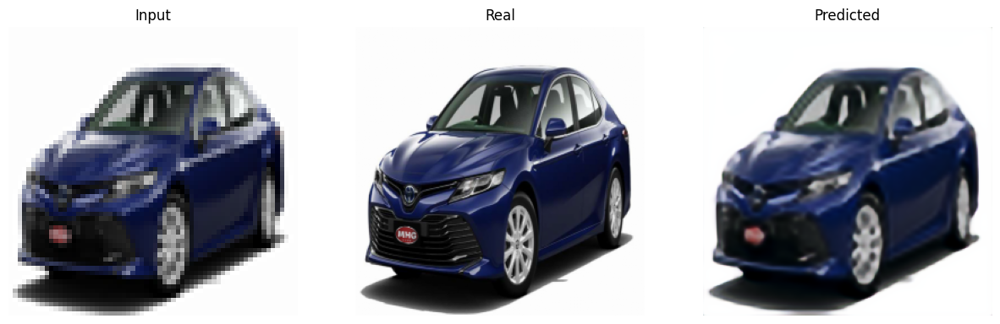

-----------------------------------------------------------
| End of epoch  24 | Time: 38.66s | Train psnr   18.787 | Train Loss    0.077 | Valid psnr   25.214 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  25 |    50/   86 batches | psnr   18.689
-----------------------------------------------------------
| End of epoch  25 | Time: 37.29s | Train psnr   18.664 | Train Loss    0.076 | Valid psnr   25.156 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  26 |    50/   86 batches | psnr   18.598
-----------------------------------------------------------
| End of epoch  26 | Time: 37.31s | Train psnr   18.593 | Train Loss    0.076 | Valid psnr   24.575 | Valid Loss    0.073 
-----------------------------------------------------------
| epoch  27 |    50/   86 batches | psnr   18.705
-----------------------------------------------------------
| End of epoch  27 | Time: 37.23s | Train psnr   17.969 | Tra

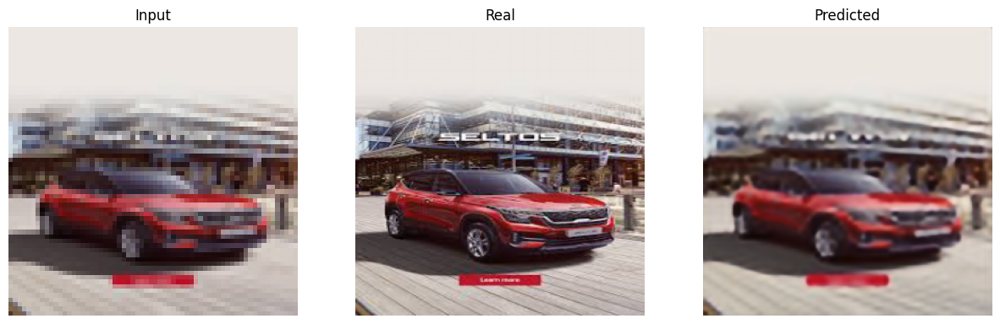

-----------------------------------------------------------
| End of epoch  34 | Time: 38.74s | Train psnr   18.779 | Train Loss    0.074 | Valid psnr   25.219 | Valid Loss    0.067 
-----------------------------------------------------------
| epoch  35 |    50/   86 batches | psnr   18.871
-----------------------------------------------------------
| End of epoch  35 | Time: 37.40s | Train psnr   18.984 | Train Loss    0.072 | Valid psnr   25.087 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  36 |    50/   86 batches | psnr   18.633
-----------------------------------------------------------
| End of epoch  36 | Time: 37.38s | Train psnr   18.996 | Train Loss    0.074 | Valid psnr   25.162 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  37 |    50/   86 batches | psnr   18.955
-----------------------------------------------------------
| End of epoch  37 | Time: 37.38s | Train psnr   18.935 | Tra

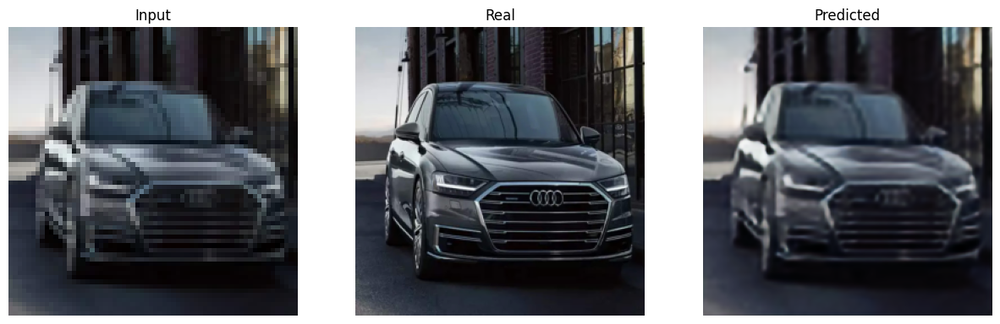

-----------------------------------------------------------
| End of epoch  42 | Time: 39.14s | Train psnr   19.246 | Train Loss    0.072 | Valid psnr   25.397 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  43 |    50/   86 batches | psnr   18.837
-----------------------------------------------------------
| End of epoch  43 | Time: 37.52s | Train psnr   19.374 | Train Loss    0.070 | Valid psnr   25.106 | Valid Loss    0.067 
-----------------------------------------------------------
| epoch  44 |    50/   86 batches | psnr   18.939
-----------------------------------------------------------
| End of epoch  44 | Time: 37.51s | Train psnr   18.888 | Train Loss    0.073 | Valid psnr   25.197 | Valid Loss    0.067 
-----------------------------------------------------------
| epoch  45 |    50/   86 batches | psnr   18.937
-----------------------------------------------------------
| End of epoch  45 | Time: 37.53s | Train psnr   19.385 | Tra

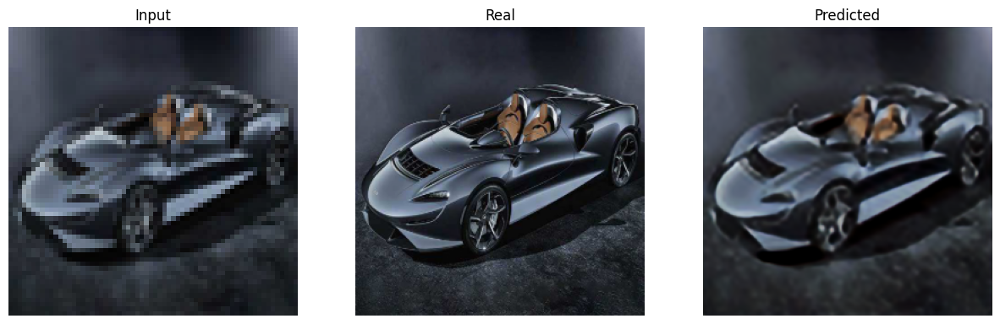

-----------------------------------------------------------
| End of epoch  56 | Time: 38.86s | Train psnr   19.136 | Train Loss    0.069 | Valid psnr   25.450 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  57 |    50/   86 batches | psnr   19.181
-----------------------------------------------------------
| End of epoch  57 | Time: 37.48s | Train psnr   19.362 | Train Loss    0.068 | Valid psnr   25.229 | Valid Loss    0.067 
-----------------------------------------------------------
| epoch  58 |    50/   86 batches | psnr   18.796
-----------------------------------------------------------
| End of epoch  58 | Time: 37.48s | Train psnr   18.984 | Train Loss    0.073 | Valid psnr   25.390 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  59 |    50/   86 batches | psnr   19.109
-----------------------------------------------------------
| End of epoch  59 | Time: 37.43s | Train psnr   19.206 | Tra

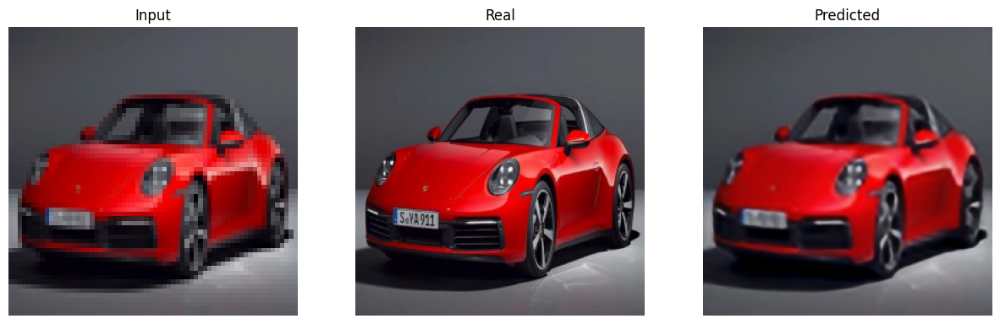

-----------------------------------------------------------
| End of epoch  64 | Time: 39.02s | Train psnr   19.333 | Train Loss    0.069 | Valid psnr   25.461 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  65 |    50/   86 batches | psnr   19.405


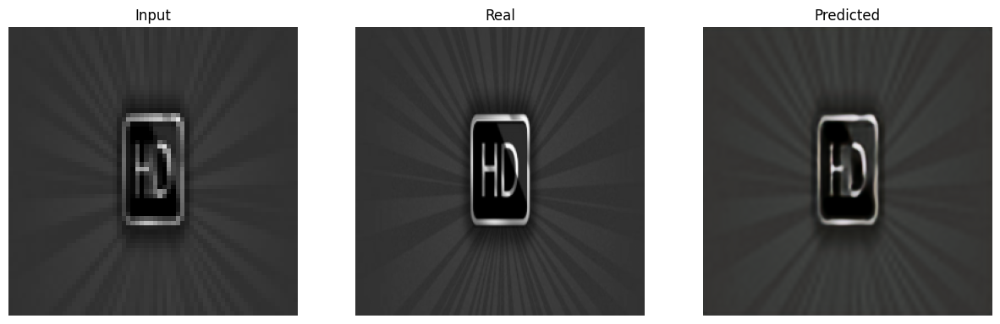

-----------------------------------------------------------
| End of epoch  65 | Time: 38.97s | Train psnr   19.310 | Train Loss    0.067 | Valid psnr   25.462 | Valid Loss    0.063 
-----------------------------------------------------------
| epoch  66 |    50/   86 batches | psnr   19.299


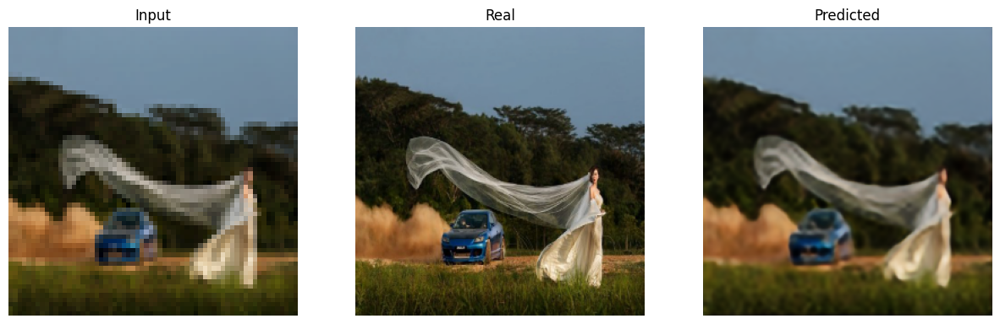

-----------------------------------------------------------
| End of epoch  66 | Time: 38.86s | Train psnr   19.393 | Train Loss    0.067 | Valid psnr   25.522 | Valid Loss    0.063 
-----------------------------------------------------------
| epoch  67 |    50/   86 batches | psnr   19.251
-----------------------------------------------------------
| End of epoch  67 | Time: 37.58s | Train psnr   19.340 | Train Loss    0.068 | Valid psnr   25.397 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  68 |    50/   86 batches | psnr   19.349
-----------------------------------------------------------
| End of epoch  68 | Time: 37.60s | Train psnr   19.297 | Train Loss    0.068 | Valid psnr   25.391 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  69 |    50/   86 batches | psnr   19.462
-----------------------------------------------------------
| End of epoch  69 | Time: 37.53s | Train psnr   19.211 | Tra

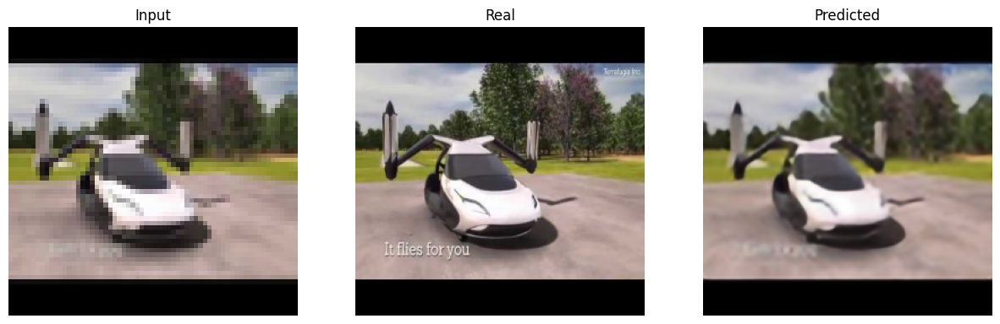

-----------------------------------------------------------
| End of epoch  70 | Time: 38.86s | Train psnr   19.133 | Train Loss    0.067 | Valid psnr   25.542 | Valid Loss    0.063 
-----------------------------------------------------------
| epoch  71 |    50/   86 batches | psnr   19.299


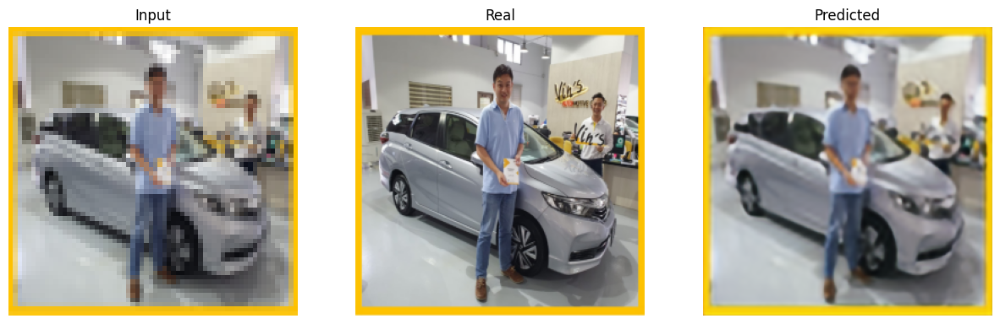

-----------------------------------------------------------
| End of epoch  71 | Time: 38.88s | Train psnr   19.564 | Train Loss    0.067 | Valid psnr   25.631 | Valid Loss    0.062 
-----------------------------------------------------------
| epoch  72 |    50/   86 batches | psnr   19.525
-----------------------------------------------------------
| End of epoch  72 | Time: 37.67s | Train psnr   19.423 | Train Loss    0.066 | Valid psnr   25.379 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  73 |    50/   86 batches | psnr   19.295
-----------------------------------------------------------
| End of epoch  73 | Time: 37.55s | Train psnr   19.506 | Train Loss    0.067 | Valid psnr   25.445 | Valid Loss    0.062 
-----------------------------------------------------------
| epoch  74 |    50/   86 batches | psnr   19.381
-----------------------------------------------------------
| End of epoch  74 | Time: 37.60s | Train psnr   19.356 | Tra

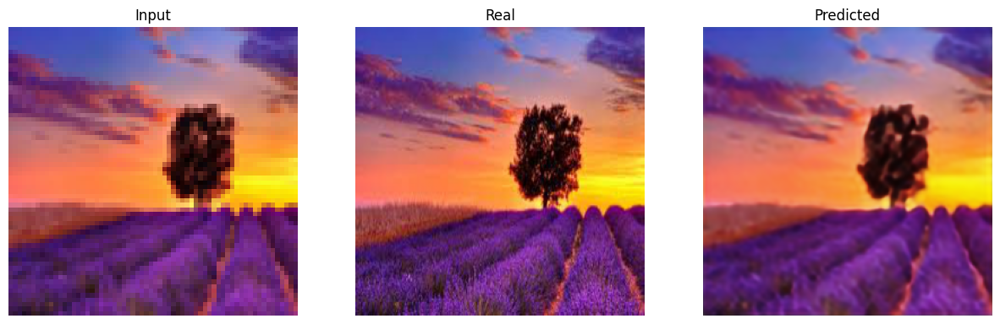

-----------------------------------------------------------
| End of epoch  93 | Time: 38.98s | Train psnr   19.486 | Train Loss    0.065 | Valid psnr   25.663 | Valid Loss    0.061 
-----------------------------------------------------------
| epoch  94 |    50/   86 batches | psnr   19.589
-----------------------------------------------------------
| End of epoch  94 | Time: 37.48s | Train psnr   19.830 | Train Loss    0.063 | Valid psnr   25.508 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  95 |    50/   86 batches | psnr   19.652
-----------------------------------------------------------
| End of epoch  95 | Time: 37.56s | Train psnr   19.463 | Train Loss    0.065 | Valid psnr   25.562 | Valid Loss    0.062 
-----------------------------------------------------------
| epoch  96 |    50/   86 batches | psnr   19.436


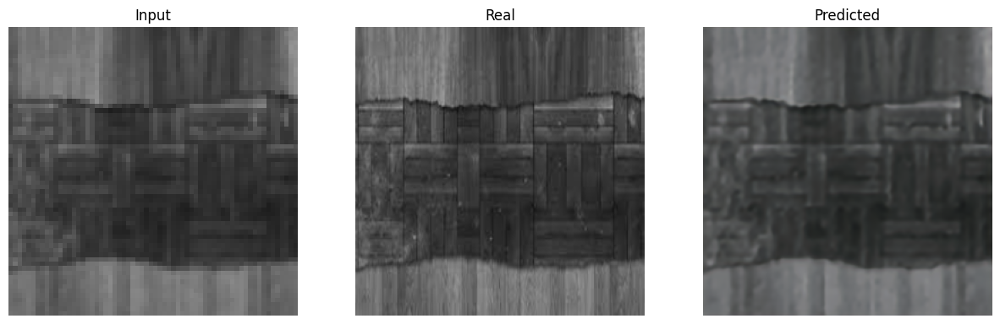

-----------------------------------------------------------
| End of epoch  96 | Time: 38.97s | Train psnr   19.698 | Train Loss    0.066 | Valid psnr   25.790 | Valid Loss    0.062 
-----------------------------------------------------------
| epoch  97 |    50/   86 batches | psnr   19.551
-----------------------------------------------------------
| End of epoch  97 | Time: 37.60s | Train psnr   19.611 | Train Loss    0.065 | Valid psnr   25.672 | Valid Loss    0.062 
-----------------------------------------------------------
| epoch  98 |    50/   86 batches | psnr   19.821
-----------------------------------------------------------
| End of epoch  98 | Time: 37.46s | Train psnr   19.340 | Train Loss    0.064 | Valid psnr   25.393 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  99 |    50/   86 batches | psnr   19.821
-----------------------------------------------------------
| End of epoch  99 | Time: 37.35s | Train psnr   19.423 | Tra

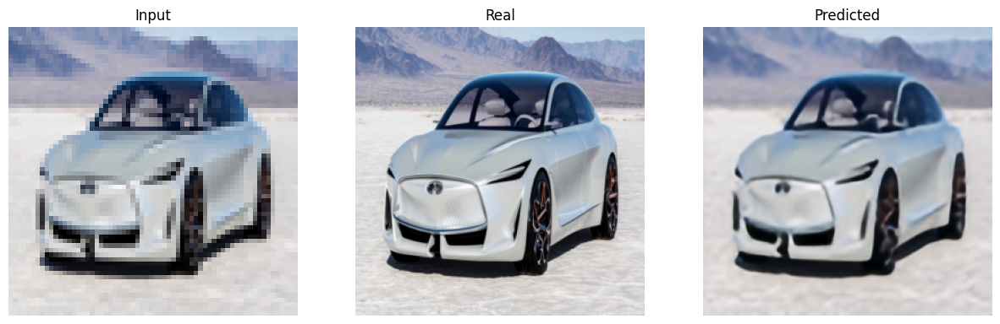

-----------------------------------------------------------
| End of epoch 100 | Time: 38.89s | Train psnr   19.765 | Train Loss    0.064 | Valid psnr   25.794 | Valid Loss    0.061 
-----------------------------------------------------------


/tmp/ipykernel_10168/1008554387.py:36: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))


In [48]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SR_unet_model = SR_Unet().to(device)
SR_unet_model.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(SR_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
SR_unet_model, metrics = train(
    SR_unet_model, 'SR_unet_model', save_model, optimizer, criterion, train_dataloader, val_dataloader, EPOCHS, device
)

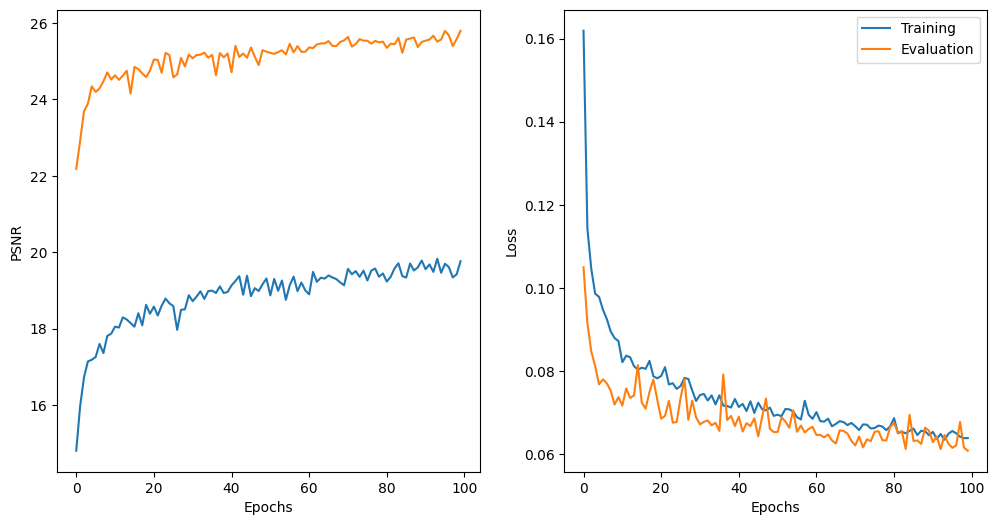

In [49]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [51]:
test_psnr, test_loss = evaluate_epoch(SR_unet_model, criterion, val_dataloader, device)
test_psnr, test_loss

(25.64765435331211, 0.06196593967351047)

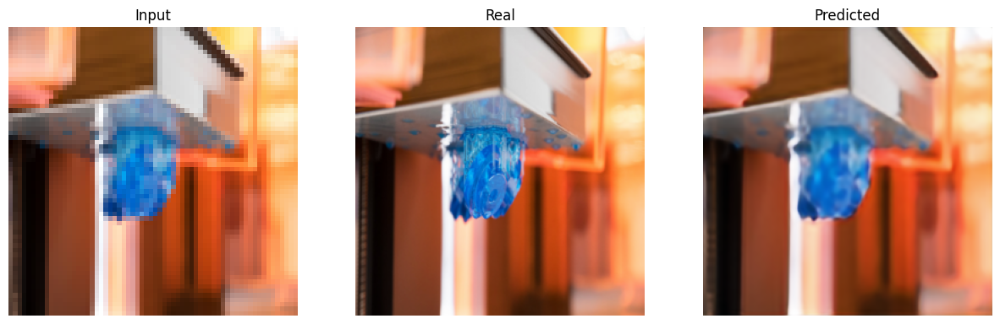

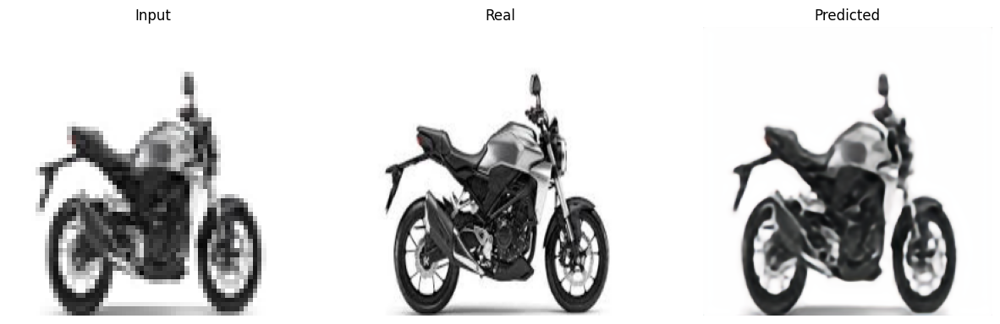

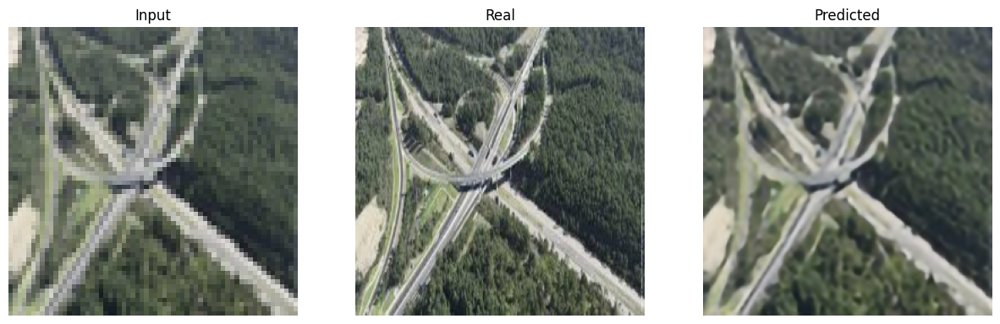

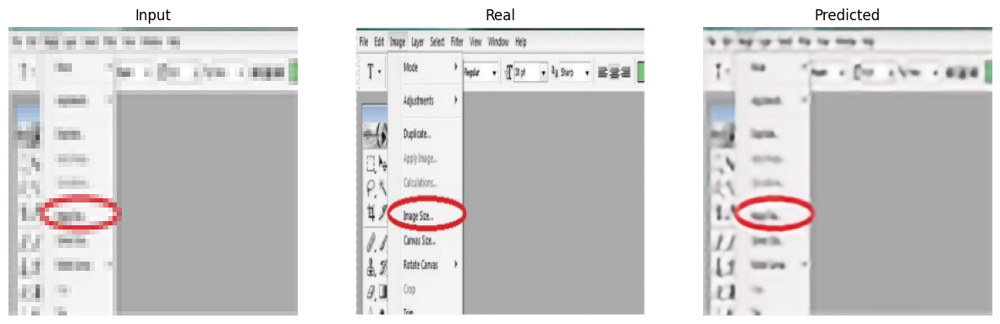

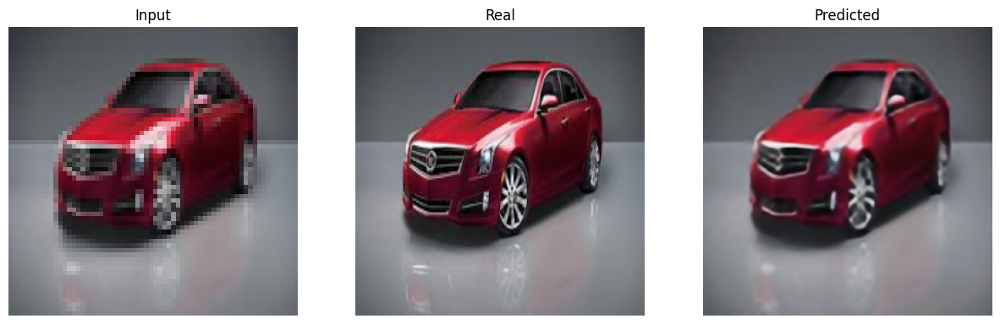

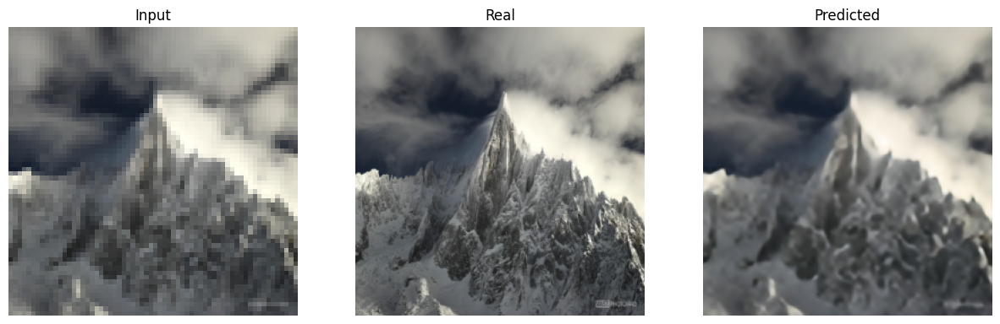

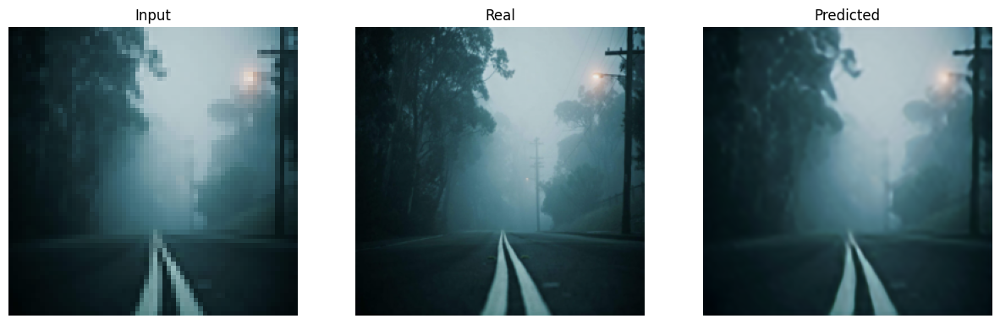

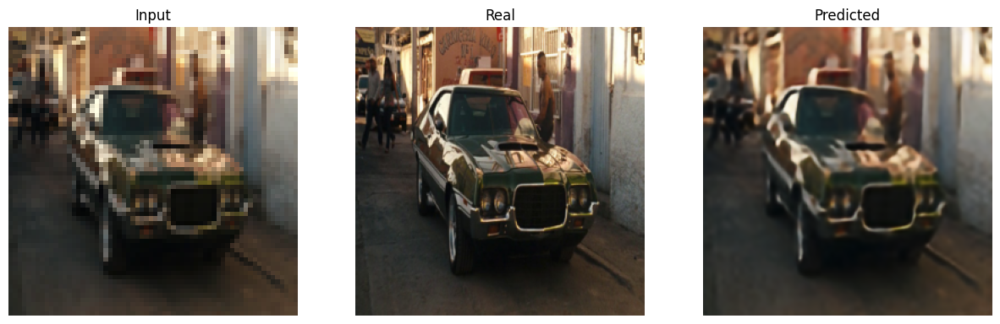

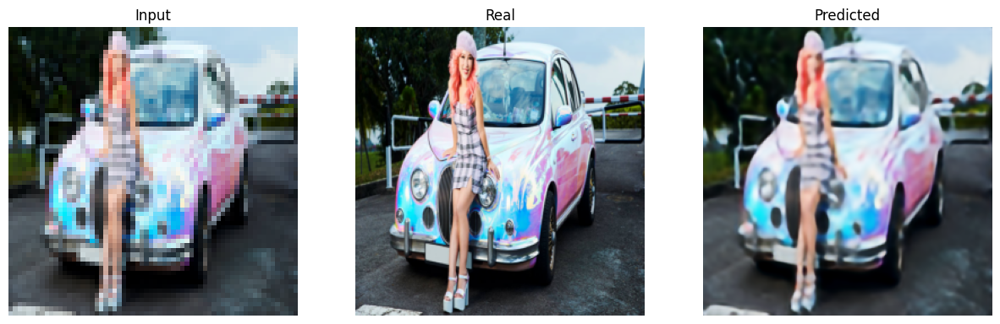

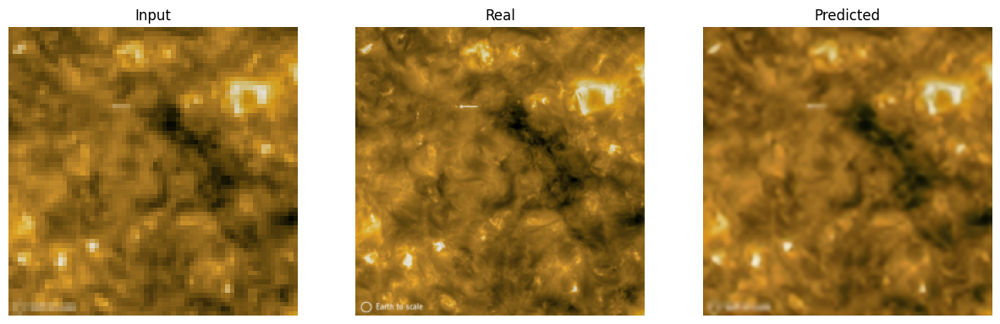

In [52]:
predict_and_display(SR_unet_model, train_dataloader, device)

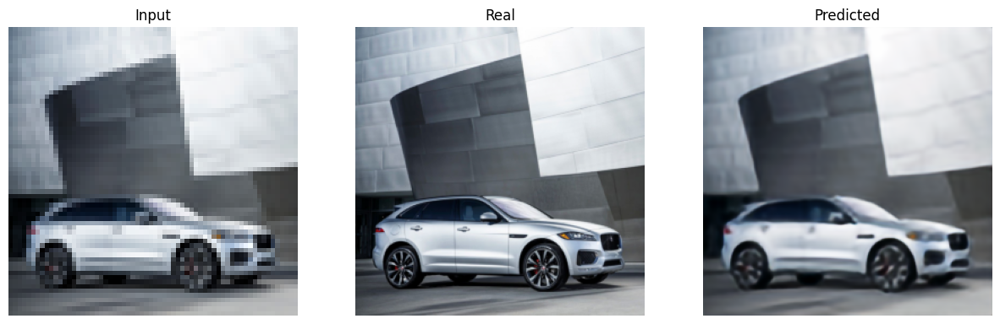

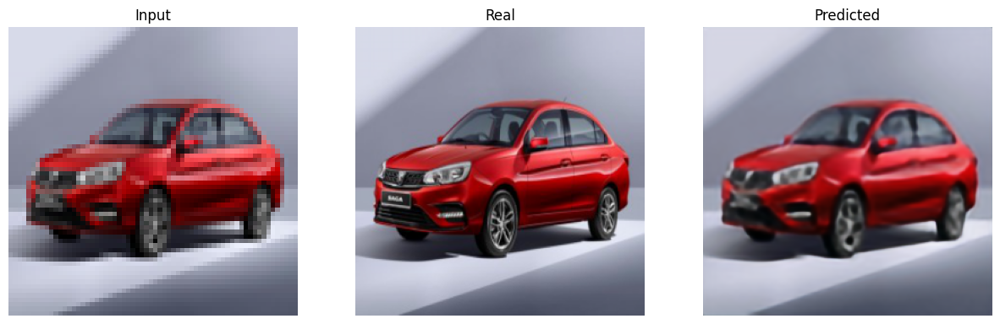

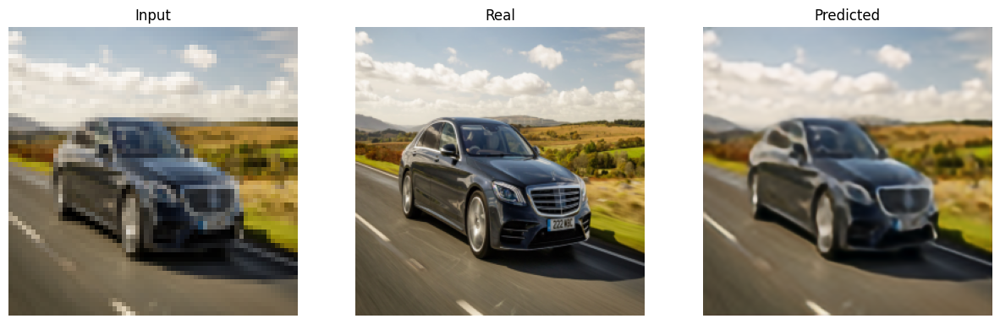

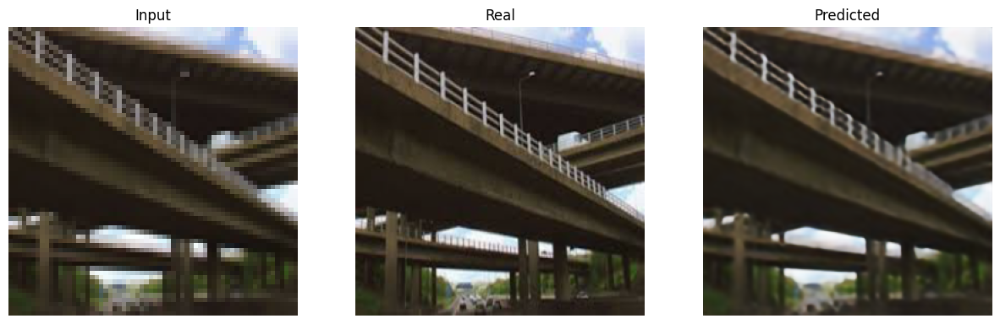

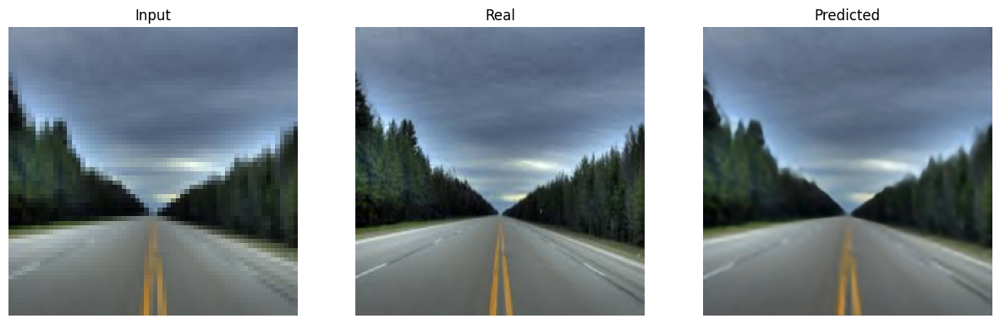

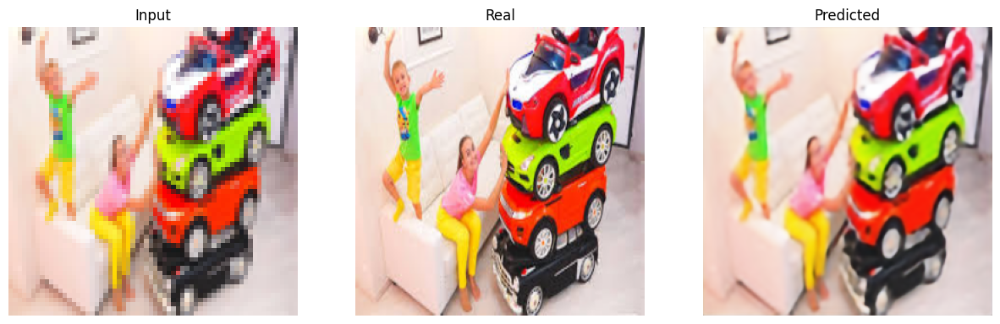

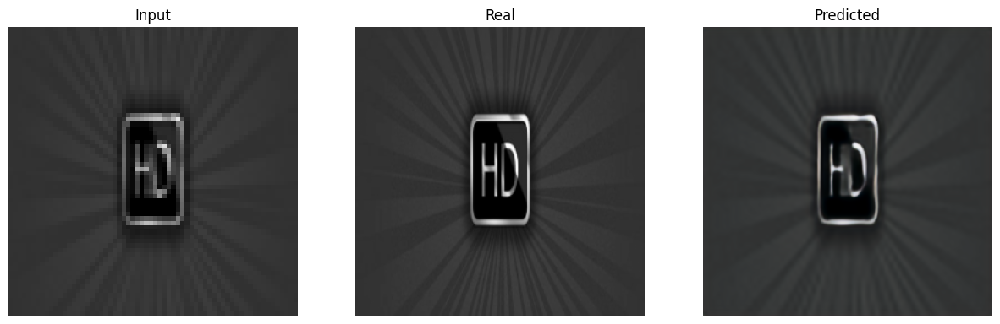

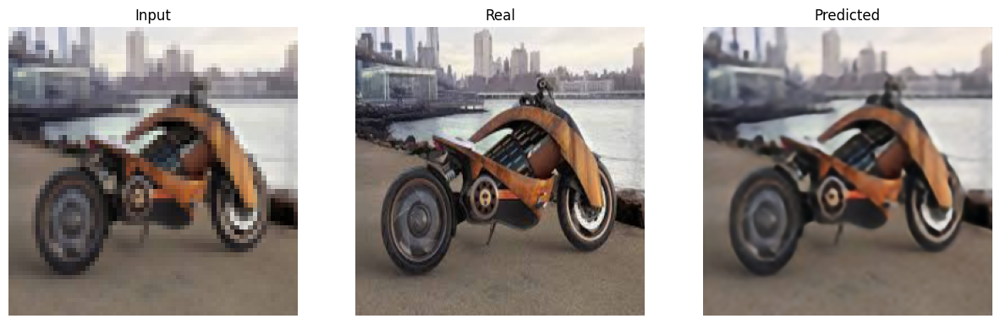

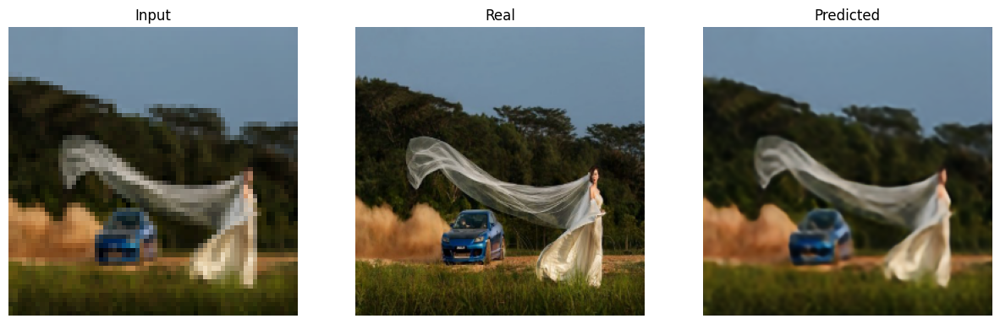

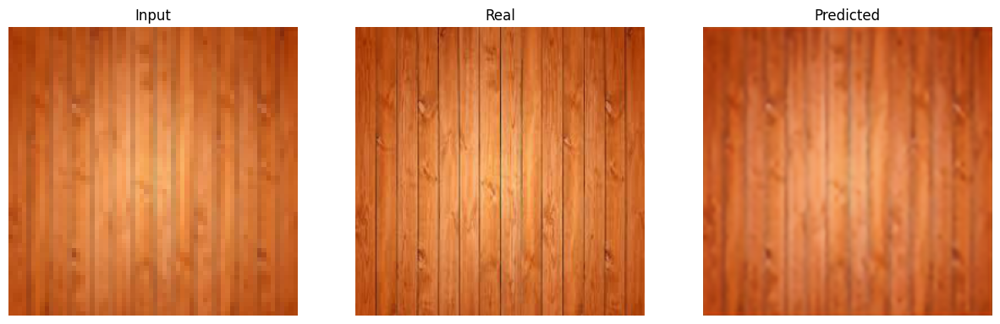

In [53]:
predict_and_display(SR_unet_model, val_dataloader, device)